# Carga de librerías

In [1]:
import pickle
import spacy
import random
import re
import string
import nltk
import textwrap

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from nltk import FreqDist
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.feature_extraction.text import TfidfVectorizer
from random import randrange, choice, sample
from string import digits

In [2]:
stopwords = nltk.corpus.stopwords.words('english')
sp = spacy.load('en_core_web_sm')

%matplotlib inline
%config InlineBackend.figure_format= 'retina'

# Listado de Funciones

La realización de diferentes métodos sobre el set de datos se simplifica y organiza
con el reciclaje de funciones, las cuales se ejecutan al inicio de este notebook

In [3]:
# Conteo de etiquetas y visualización de etiquetas.

def sns_histo(df, label_x, label_y, title_graph):
  sns.countplot(
    x='label',
    data=df,
    order=df.label.value_counts().index)

  plt.xlabel(label_x)
  plt.ylabel(label_y)
  plt.title(title_graph);

In [4]:
# Conversión de texto en formato NLTK para análisis específicos

def conv_nltk(list):
    tokens = nltk.word_tokenize(str(list))
    return(nltk.Text(tokens))

In [5]:
# Conteo de tokens de cada cadena de texto con la separación
## de los espacios en blanco

def split_tokens(text): 
    c = 0
    for word in text.split(): 
        c += 1
    return(c)

In [6]:
#Vizualización de la nube de palabras 

def show_word_cloud(cloud, title):
  plt.figure(figsize = (16, 10))
  plt.imshow(cloud, interpolation='bilinear')
  plt.title(title)
  plt.axis("off")
  plt.show();

In [7]:
# Visualización de filtrado y términos más frecuentes. 
## Longitud máxima de 5

def Filter_FreQ_plot(list):
    dict = {}
    for word, value in list.items():
        if word in stopwords:
            pass
        elif len(word) < 5:
            pass
        else:
            dict[word] = value
    plot_dict = FreqDist(dict)
    plot_dict.plot(20, cumulative = True)

In [8]:
# Truncado de texto en tres etapas: puntos (.), comas (,) 
## y longitud máxima de 15 

def cut_text_len(list):
    temp = []
    temp_coma = []
    temp_list = []

    for sentence in list: temp.extend(sentence.split('.'))
    for sentence in temp: temp_coma.extend(sentence.split(','))
    temp_coma = [sentence for sentence in temp_coma if len(sentence.split()) > 2]

    for sentence in temp_coma:
        text = sentence.split()
        new_sentence = ''
        len_sentence = 0
        mess = len(text)
        while mess > 0:
            new_sentence += text[0] + ' '
            text.pop(0)
            len_sentence += 1
            mess = len(text)
            if len_sentence == 15:            
                temp_list.append(new_sentence)
                new_sentence = ''
                len_sentence = 0
                mess = len(text)
            elif mess == 0:
                mess = len(new_sentence.split())
                if mess <= 2:
                    break
                temp_list.append(new_sentence)
                break
    return(temp_list)

In [9]:
# Limpieza de stopwords.
## Lista extraída de NLTK

def delete_stopW(list): 
    temp = []
    for text in list:
        sentence = ''
        for w in text.split():
            if w in stopwords:
                pass
            else: 
                sentence += w + ' '
        temp.append(sentence)
    return(temp)

In [10]:
# Limpieza de las cadenas de caracteres con mezcla de diccionario "contractions"
## y sustitución con patrón de la librería Regex.

def clean_text(list):   
    text_clean = []
    for text in list:
        text = text.lower()
        new_text = ''
        for word in text.split():
            for key in contractions:
                if word == key:
                    word = contractions[key]
            new_text += word + ' '
        text = re.sub(r'([a-zA-Z0-9+._-]+@[a-zA-Z0-9._-]+\.[a-zA-Z0-9_-]+)', '', new_text) 
        text = re.sub(patron_web, '', text)
        table = str.maketrans(' ', ' ', string.punctuation)
        stripped = [word.translate(table) for word in text]
        text = ''.join(stripped)
        table = str.maketrans('', '', digits)
        newtext = text.translate(table)
        newtext = re.sub("\'", '', newtext)
        text_clean.append(newtext)

    return(text_clean)

# Fuente: https://kgptalkie.com/3664-2/
# Lista de contracciones en inglés extraída de "NLP: End to End Text Processing for Beginners" (., Roshan)

contractions = { 
"ain't": "am not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how does",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so is",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"aint": "am not",
"arent": "are not",
"cant": "can not",
"cantve": "cannot have",
"cause": "because",
"couldve": "could have",
"couldnt": "could not",
"couldntve": "could not have",
"didnt": "did not",
"doesnt": "does not",
"dont": "do not",
"hadnt": "had not",
"hadntve": "had not have",
"hasnt": "has not",
"havent": "have not",
"hed": "he would",
"hedve": "he would have",
"hell": "he will",
"hellve": "he will have",
"hes": "he is",
"howd": "how did",
"howdy": "how do you",
"howll": "how will",
"hows": "how does",
"id": "i would",
"idve": "i would have",
"ill": "i will",
"illve": "i will have",
"im": "i am",
"ive": "i have",
"isnt": "is not",
"itd": "it would",
"itdve": "it would have",
"itll": "it will",
"itllve": "it will have",
"its": "it is",
"lets": "let us",
"maam": "madam",
"maynt": "may not",
"mightve": "might have",
"mightnt": "might not",
"mightntve": "might not have",
"mustve": "must have",
"mustnt": "must not",
"mustntve": "must not have",
"neednt": "need not",
"needntve": "need not have",
"oclock": "of the clock",
"oughtnt": "ought not",
"oughtntve": "ought not have",
"shant": "shall not",
"shant": "shall not",
"shantve": "shall not have",
"shed": "she would",
"shedve": "she would have",
"shell": "she will",
"shellve": "she will have",
"shes": "she is",
"shouldve": "should have",
"shouldnt": "should not",
"shouldntve": "should not have",
"sove": "so have",
"sos": "so is",
"thatd": "that would",
"thatdve": "that would have",
"thats": "that is",
"thered": "there would",
"theredve": "there would have",
"theres": "there is",
"theyd": "they would",
"theydve": "they would have",
"theyll": "they will",
"theyllve": "they will have",
"theyre": "they are",
"theyve": "they have",
"tove": "to have",
"wasnt": "was not", 
"u": " you  ",
"ur": "your", 
"n": "and", 
"friends": "",
"friend":"",
"people":"",
"girl":"",
"girlfriend": "",
"grl":"",
"nt": "not",
"gf": "", 
"cuttersuicidal": "suicidal", 
"idk": "i do not know", 
"theripist": "therapist",
"s": "is",
"mt": "",
"cuttersuicidal": "cutter suicidal"
}

patron_web = r'(http|ftp|https)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?'

In [11]:
# Lematización con Spacy.

def text_to_spacy(list): 
    temp = []
    for sentence in list:
        new_sentence = ''
        for word in sp(str(sentence)):
            new_sentence += word.lemma_ + ' '
        temp.append(new_sentence.lower())
    return(temp)


In [12]:
# Función para calcular la frecuencia de los términos con 
## el método TF-IDF

def plot_tfidf(list, porcentual):
    vectorizer = TfidfVectorizer(max_df=.65, min_df=1, stop_words=stopwords, use_idf=True, norm=None)
    vectors = vectorizer.fit_transform(list)
    feature_names = vectorizer.get_feature_names()
    dense = vectors.todense()
    denselist = dense.tolist()
    df_temp = pd.DataFrame(denselist, columns = feature_names)
    idf_df_global_flagged = {}
    for col_name in df_temp.columns:
        idf_df_global_flagged[col_name] = df_temp[col_name].mean()
    filtered_dictionary = {}
    for key, value in idf_df_global_flagged.items(): 
        if value >= porcentual: 
            filtered_dictionary[key] = value
    plt.scatter(*zip(*filtered_dictionary.items()))
    plt.xticks(rotation=90)
    plt.show()

In [13]:
# Visualización de histograma con la cantidad de palabras.

def hist_cant_word(list): 
    df_temp = pd.DataFrame(list, columns = ["text"])
    df_temp['W_cant'] = df_temp['text'].apply(lambda x: split_tokens(x))
    plt.hist(df_temp.W_cant)
    del(df_temp)

In [14]:
# Eliminar duplicados y espacios en blanco

def duplicated(list): 
    temp = []
    for sentence in list:
        new_sentence = sentence.split() 
        new_sentece_join = ' '.join(new_sentence)
        if new_sentece_join not in temp: 
            temp.append(new_sentece_join)
    temp.pop(0)
    return(temp)

# EDA

Preprocesamiento y visualización del set de datos. 
En una primera parte, se analizará el conjunto entero de los datos, seguido del análisis, preprocesamiento y comparación
de la data.

In [15]:
df_pre = pd.read_csv("./Data/Sheet_1.csv")

#Fuente: https://www.kaggle.com/samdeeplearning/deepnlp

In [16]:
df_pre.head()

,response_id,class,response_text,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,response_1,not_flagged,I try and avoid this sort of conflict,NaN,NaN,NaN,NaN,NaN
1,response_2,flagged,Had a friend open up to me about his mental ad...,NaN,NaN,NaN,NaN,NaN
2,response_3,flagged,I saved a girl from suicide once. She was goin...,NaN,NaN,NaN,NaN,NaN
3,response_4,not_flagged,i cant think of one really...i think i may hav...,NaN,NaN,NaN,NaN,NaN
4,response_5,not_flagged,Only really one friend who doesn't fit into th...,,NaN,NaN,NaN,NaN


In [17]:
df_pre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80 entries, 0 to 79
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   response_id    80 non-null     object 
 1   class          80 non-null     object 
 2   response_text  80 non-null     object 
 3   Unnamed: 3     2 non-null      object 
 4   Unnamed: 4     0 non-null      float64
 5   Unnamed: 5     1 non-null      object 
 6   Unnamed: 6     0 non-null      float64
 7   Unnamed: 7     1 non-null      object 
dtypes: float64(2), object(6)
memory usage: 5.1+ KB


El de datos tiene varias columnas sin ningún tipo de información. 
Este trabajo se enfocará en "response_text" (a partir de ahora, "text") y "class" (a partir de ahora "label").
Los textos están divididos en dos clases: flagged (textos que han sido etiquetados como de riesgo o posibilidad
de incidencia de suicidio) y not_flagged (textos que no muestran mayor riesgo)

In [18]:
columns_df = df_pre[['response_text', 'class']]
df = columns_df.copy()
columns_name = ["text", "label"]
df.columns = columns_name
df.head()

,text,label
0,I try and avoid this sort of conflict,not_flagged
1,Had a friend open up to me about his mental ad...,flagged
2,I saved a girl from suicide once. She was goin...,flagged
3,i cant think of one really...i think i may hav...,not_flagged
4,Only really one friend who doesn't fit into th...,not_flagged


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80 entries, 0 to 79
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    80 non-null     object
 1   label   80 non-null     object
dtypes: object(2)
memory usage: 1.4+ KB


In [20]:
df.describe()

,text,label
count,80,80
unique,80,2
top,"Having self harmed in the past, I shared my e...",not_flagged
freq,1,55


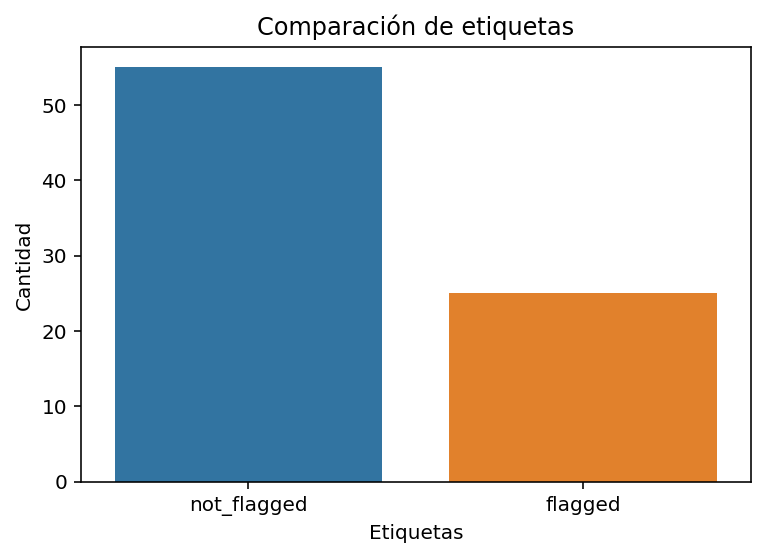

In [21]:
sns_histo(df, label_x = "Etiquetas", label_y = "Cantidad", title_graph = "Comparación de etiquetas")

In [22]:
print(" Conteo de etiquetas ") 
df.label.value_counts()

 Conteo de etiquetas 


not_flagged    55
flagged        25
Name: label, dtype: int64

In [23]:
# Agregado de columna con la cantidad de palabras por oración

df['W_cant'] = df['text'].apply(lambda x: split_tokens(x))
df.head()

,text,label,W_cant
0,I try and avoid this sort of conflict,not_flagged,8
1,Had a friend open up to me about his mental ad...,flagged,25
2,I saved a girl from suicide once. She was goin...,flagged,29
3,i cant think of one really...i think i may hav...,not_flagged,11
4,Only really one friend who doesn't fit into th...,not_flagged,72


In [24]:
print("Media de palabras en el set de datos:", df['W_cant'].mean())

Media de palabras en el set de datos: 31.225


In [25]:
# Creación de lista con todos los textos

word_list = df['text'].tolist()

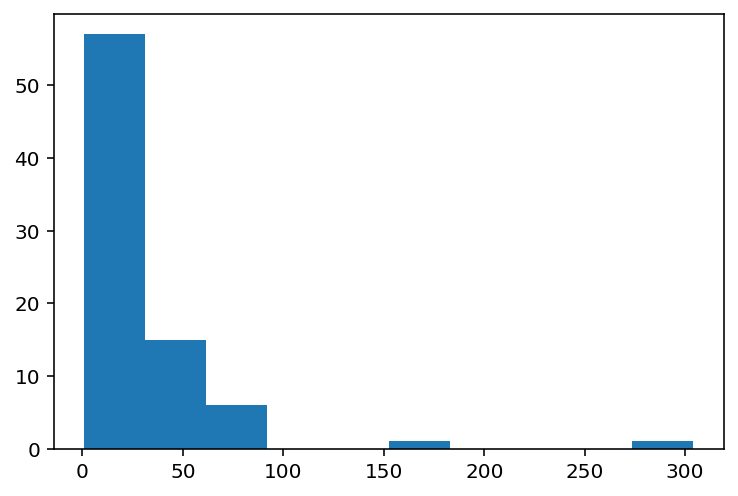

In [26]:
hist_cant_word(word_list)

Visualización inicial de las cadenas de textos más largas y cortas del set de datos

In [27]:
def print_sample(text, w_cant, label):
    text_w = textwrap.wrap(text)
    return(print('Cantidad de palabras: '  + str(w_cant) + ' | ' + 'Texto: ' + text + ' | ' + 'Etiqueta: ' + label ))

In [28]:
text, w_cant, label = df.loc[48, ['text', 'W_cant', 'label']].to_numpy()
print_sample(text, w_cant, label)

Cantidad de palabras: 304 | Texto: I had a friend that would go off about girls and get super depressed. He told me he was going to kill himself one night and I drove 1n hour and a half to go look for him. By then the cops had already taken him to the hospital but me and a friend went and hung out with him. Also been there to help try and talk him down. Another person I hadnt been friends with for years cause of some stuff called me out of the blue on thankgiving last year. I called back and got a hospital number so I knew something was up. Ended up being a kid who I was friends with years before but was a huge douche to me. He was in the psych ward for trying to kill himself. I got a hold of him and talked to him for a while. Whenever he would call I would answer and be there even though I still had the shit from years earlier on my mind. There are people that I might not want to be around but if it's a situation like this I'll be there for people. My goal or purpose in life that's su

In [29]:
text, w_cant, label = df.loc[65, ['text', 'W_cant', 'label']].to_numpy()
print_sample(text, w_cant, label)

Cantidad de palabras: 4 | Texto: Helped friends through stuff. | Etiqueta: not_flagged


In [30]:
text, w_cant, label = df.loc[55, ['text', 'W_cant', 'label']].to_numpy()
print_sample(text, w_cant, label)

Cantidad de palabras: 88 | Texto: Over the internet a LOT of people write to me to talk about their problems. Its often girl related, I dont know, I guess it can be nice to rant to someone you dont know irl/someone who can look at the situation a little bit more objective? I think a lot of guys also feel that it can be hard to talk to girl friends irl about their innermost feelings sometimes, thats the feeling I get at least. My friend jokingly refers to me as an Agony Aunt" | Etiqueta: not_flagged


## Visualizaciones - línea base

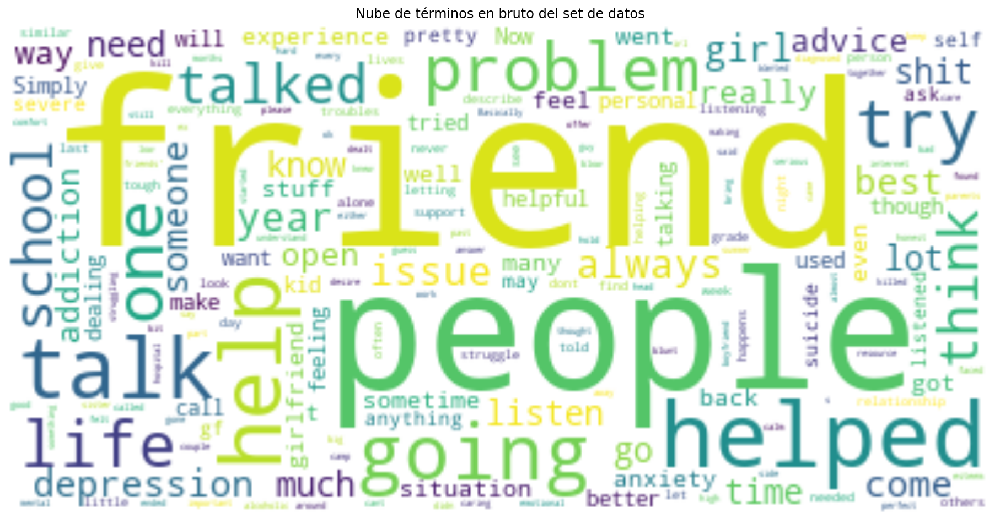

In [31]:
word_list_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(word_list))
show_word_cloud(word_list_cloud, "Nube de términos en bruto del set de datos")

Visualización de los términos más frecuentes del set de datos 
con el método TF-IDF en un gráfica de dispersión en donde se eligió 
a partir del 30% de los mismos.

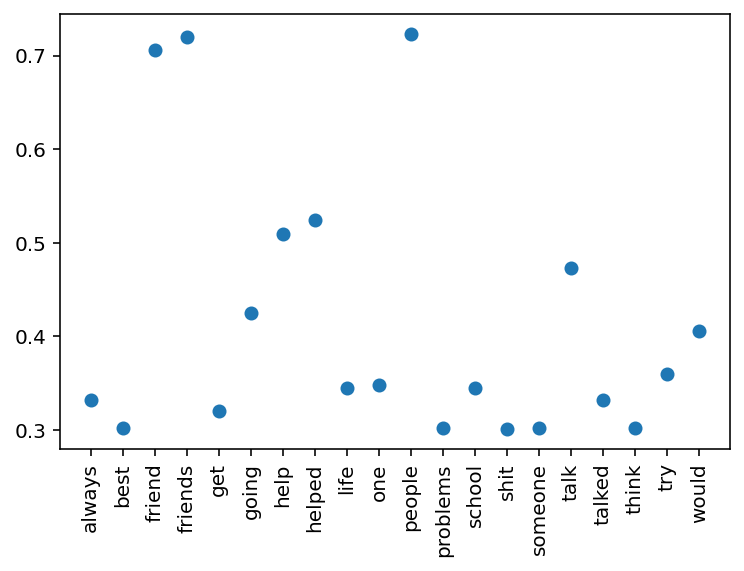

In [32]:
plot_tfidf(word_list, 0.3)

In [33]:
# Cargar en listas de las entradas de las etiquetas flagged y not_flagged

Flagged_List = df['text'][df.label == 'flagged'].to_list()
NotFlagged_List = df['text'][df.label == 'not_flagged'].to_list()

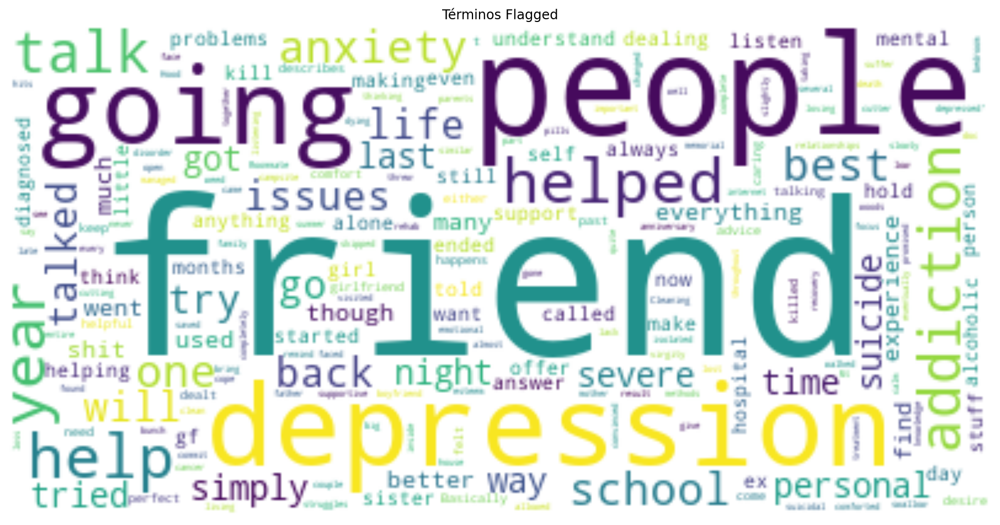

In [34]:
word_list_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(Flagged_List))
show_word_cloud(word_list_cloud, "Términos Flagged")

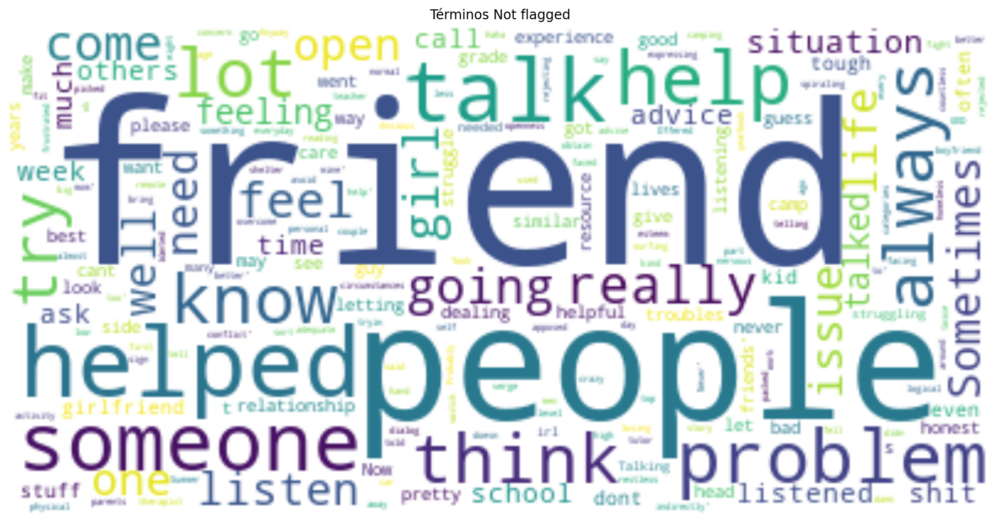

In [35]:
word_list_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(NotFlagged_List))
show_word_cloud(word_list_cloud, "Términos Not flagged")

# Observaciones iniciales:

* El set de datos tiene una varianza de conteo de tokens muy alta con una media 32 tokens, siendo 300 la mayor cantidad
* Hay términos repetidos que no parecen tener una carga semántica importante en una clasificación, ejemplo: "friends y friend" o "people"
* Desbalanceo del conteo total de etiquetas
* Set con poco conteo de entradas; aunque es uno de los objetivos de este trabajo, es importante destacarlo

# Not_Flagged

In [36]:
print("Muestra de textos en bruto:")

NotFlagged_List[:5]

Muestra de textos en bruto:


['I try and avoid this sort of conflict',
 'i cant think of one really...i think i may have indirectly',
 'Only really one friend who doesn\'t fit into the any of the above categories. Her therapist calls it spiraling." Anyway she pretty much calls me any time she is frustrated by something with  her boyfriend to ask me if it\'s logical or not. Before they would just fight and he would call her crazy. Now she asks me if it\'s ok he didn\'t say "please" when he said  "hand me the remote."',
 'a couple of years ago my friends was going to switch school because of low self esteem too. I helped him overcome that shit too',
 'Listened to someone talk about relationship troubles. Offered some advice from personal experience.']

## Visualización inicial

Frecuencia de términos por encima del 20% | TF-IDF


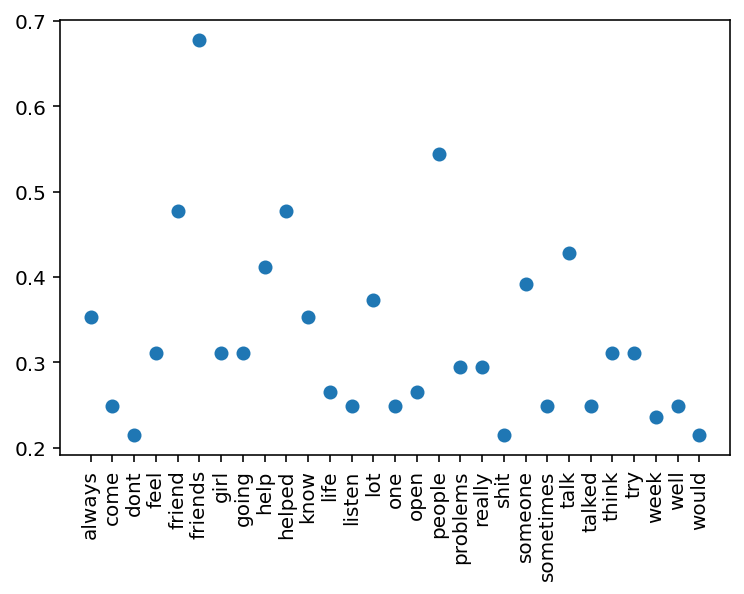

In [37]:
print("Frecuencia de términos por encima del 20% | TF-IDF")
plot_tfidf(NotFlagged_List, 0.20)

Cantidad de tokens de textos en bruto


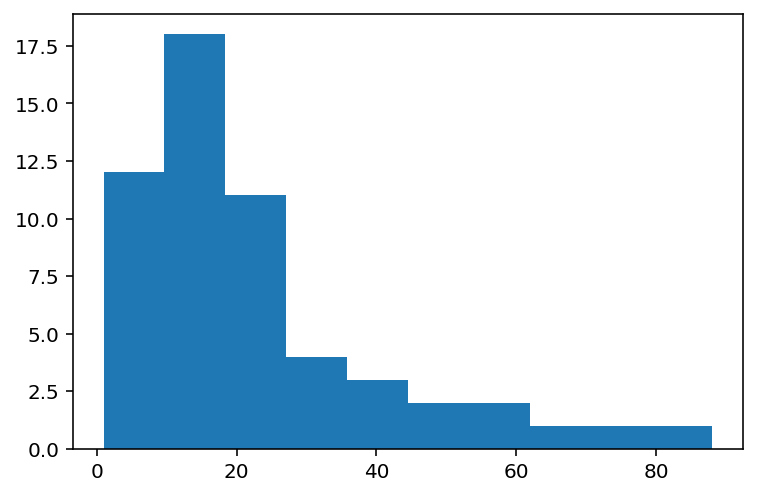

In [38]:
print("Cantidad de tokens de textos en bruto")
hist_cant_word(NotFlagged_List)

## Observaciones: 
* De la misma manera que notamos en el apartado anterior, el conjunto de entradas de la etiqueta
"not_flagged" tiene un desbalanceo alto en su conjunto con una cola hacia la derecha y 
acumulación de conteos cerca de la medida 15. 
* Notamos que en la frecuencia de términos hay cierta cohesión cerca del 40% con valores
límites en el 70% que tampoco ofrecen valor semántico. 

## Preprocesamiento

In [39]:
# Truncamiento de cadenas según llamado de función

NotFlagged_Short = cut_text_len(NotFlagged_List)
print("Muestra:")
NotFlagged_Short[:10]

Muestra:


['I try and avoid this sort of conflict ',
 'i cant think of one really ',
 'i think i may have indirectly ',
 "Only really one friend who doesn't fit into the any of the above categories ",
 'Her therapist calls it spiraling ',
 '" Anyway she pretty much calls me any time she is frustrated by something with ',
 "her boyfriend to ask me if it's logical or not ",
 'Before they would just fight and he would call her crazy ',
 'Now she asks me if it\'s ok he didn\'t say "please" when he said "hand ',
 'me the remote ']

In [40]:
# Limpieza básica de las candenas truncadas

NotFlagged_Clean = clean_text(NotFlagged_Short)
print("Muestra")
NotFlagged_Clean[:10]

Muestra


['i try and avoid this sort of conflict ',
 'i can not think of one really ',
 'i think i may have indirectly ',
 'only really one  who does not fit into the any of the above categories ',
 'her therapist calls it spiraling ',
 ' anyway she pretty much calls me any time she is frustrated by something with ',
 'her boyfriend to ask me if it is logical or not ',
 'before they would just fight and he would call her crazy ',
 'now she asks me if it is ok he did not say please when he said hand ',
 'me the remote ']

In [41]:
# Lematización

NotFlagged_Spacy = text_to_spacy(NotFlagged_Clean)
print("Muestra:")
NotFlagged_Spacy[:10]

Muestra:


['i try and avoid this sort of conflict ',
 'i can not think of one really ',
 'i think i may have indirectly ',
 'only really one   who do not fit into the any of the above category ',
 'her therapist call it spiral ',
 '  anyway she pretty much call i any time she be frustrate by something with ',
 'her boyfriend to ask i if it be logical or not ',
 'before they would just fight and he would call she crazy ',
 'now she ask i if it be ok he do not say please when he say hand ',
 'i the remote ']

In [42]:
# Borrado de stopwords de las cadenas de texto sin lematizar

NotFlagged_no_stopword = delete_stopW(NotFlagged_Clean)
print("Muestra:")
NotFlagged_no_stopword[:10]

Muestra:


['try avoid sort conflict ',
 'think one really ',
 'think may indirectly ',
 'really one fit categories ',
 'therapist calls spiraling ',
 'anyway pretty much calls time frustrated something ',
 'boyfriend ask logical ',
 'would fight would call crazy ',
 'asks ok say please said hand ',
 'remote ']

## Observaciones: 
* El conjunto de cadenas de textos procesadas ya aumenta la cantidad de entradas de la lista
* Unir diferentes formas de la misma cadena, ya sea sin verbos, lematizada, completa o sin términos de enlace
es importe para que al momento de clasificar los modelos puedan recoger diferentes patrones.

In [43]:
# Creación de una nueva variable con todos las variables preprocesadas
NotFlagged_basic = NotFlagged_Spacy + NotFlagged_no_stopword

#se eliminan las oraciones que posiblemente sean idénticas entre sí.
NotFlagged_basic = duplicated(NotFlagged_basic)

In [44]:
print("Tamaño de la nueva variable procesada: ", len(NotFlagged_basic))

Tamaño de la nueva variable procesada:  243


In [45]:
# Binarización de la variable
pickle.dump(NotFlagged_basic, open("./data_final/NotFlagged_basic.p", "wb" ))

FileNotFoundError: [Errno 2] No such file or directory: './data_final/NotFlagged_basic.p'

# Visualización final de la sección Not_flagged

Frecuencia de términos por encima del 20% | TF-IDF


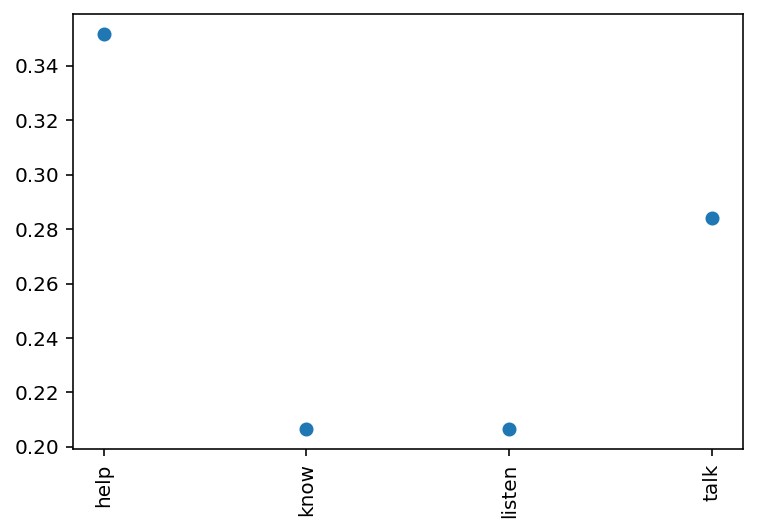

In [46]:
print("Frecuencia de términos por encima del 20% | TF-IDF")
plot_tfidf(NotFlagged_basic, 0.20)

Cantidad de tokens de textos


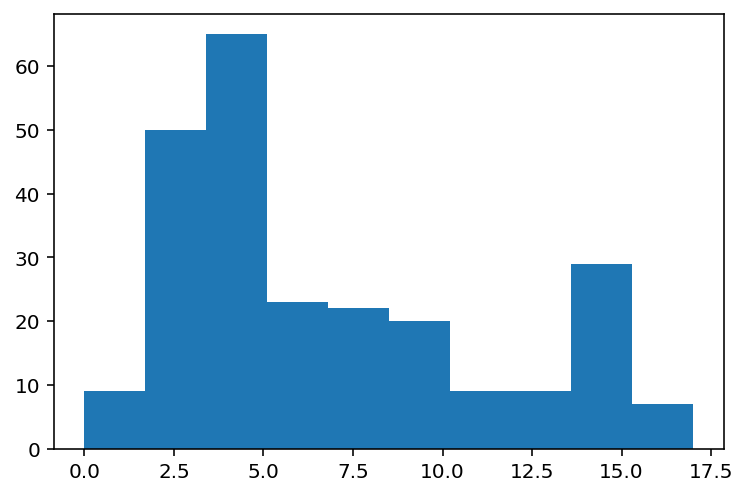

In [47]:
print("Cantidad de tokens de textos")
hist_cant_word(NotFlagged_basic)

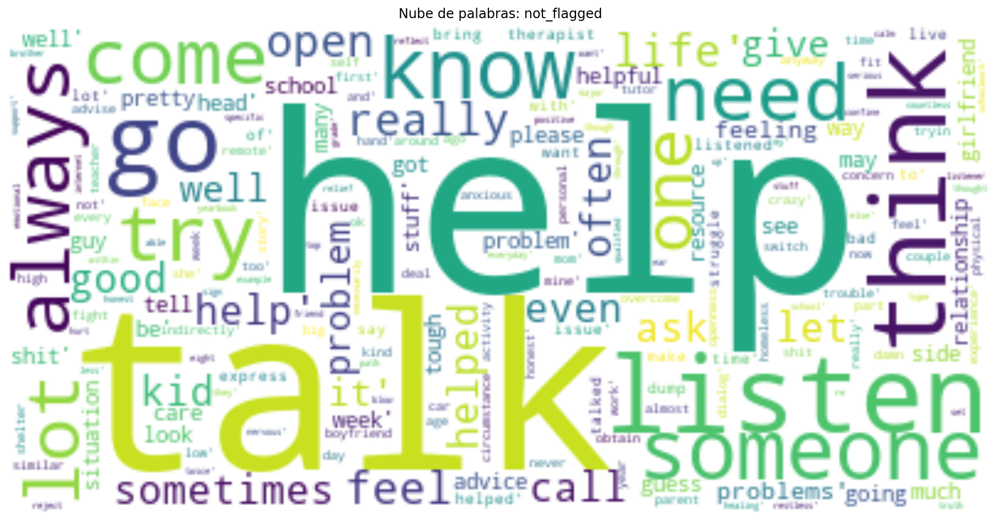

In [48]:
flagged_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(NotFlagged_basic))
show_word_cloud(flagged_cloud, "Nube de palabras: not_flagged")

# Flagged

In [49]:
print("Muestra de textos en bruto:")
Flagged_List[:5]

Muestra de textos en bruto:


['Had a friend open up to me about his mental addiction to weed and how it was taking over his life and making him depressed',
 'I saved a girl from suicide once. She was going to swallow a bunch of pills and I talked her out of it in a very calm, loving way.',
 'Roommate when he was going through death and loss of a gf. Did anything to get him out of his bedroom.',
 "i've had a couple of friends (you could say more than friends) with quite severe depression/ emotional problems. i helped for a while but eventually both relationships started to suffer as a result of both our personal problems",
 'I will always listen. I comforted my sister when she lost her virgity the same night she walked in on her boyfriend cutting himself, and then our parents found out she threw a house part. Simply bring supportive was my focus.']

## Visualización inicial

Frecuencia de términos por encima del 20% | TF-IDF


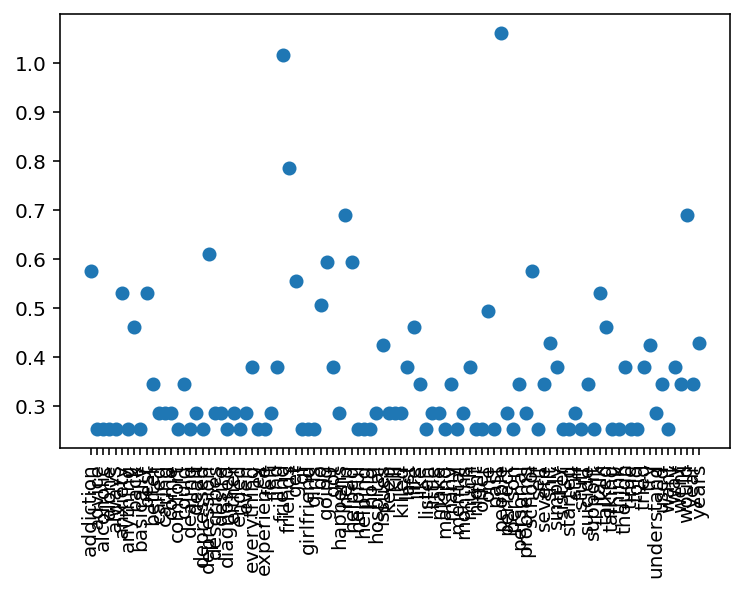

In [50]:
print("Frecuencia de términos por encima del 20% | TF-IDF")
plot_tfidf(Flagged_List, 0.20)

Cantidad de tokens de textos en bruto


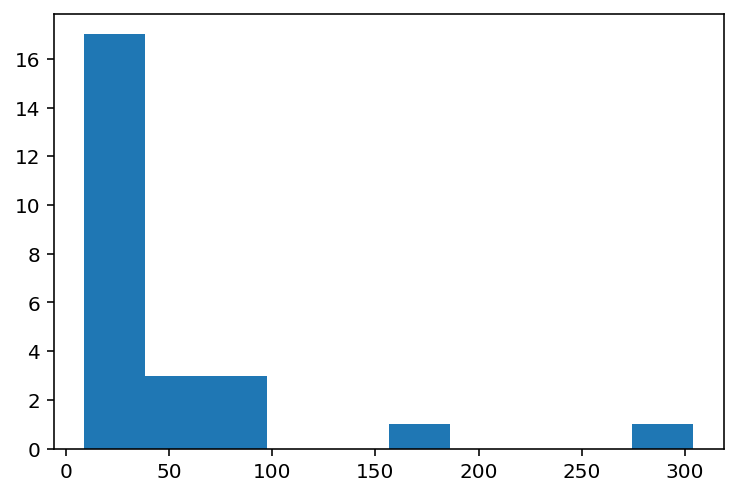

In [51]:
print("Cantidad de tokens de textos en bruto")
hist_cant_word(Flagged_List)

## Observaciones: 
* En el caso de las entradas de la etiqueta "flagged" al ser menos cantidad  y reunidas en cadenas más largas, su 
frecuencia de términos en caótica, reunidas todas en torno en menos del 20% y valores límites muy superiores a la media. 

## Preprocesamiento

In [52]:
# Truncamiento de cadenas según llamado de función

Flagged_Short = cut_text_len(Flagged_List)
print("Muestra:")
Flagged_Short[:10]

Muestra:


['Had a friend open up to me about his mental addiction to weed and how ',
 'it was taking over his life and making him depressed ',
 'I saved a girl from suicide once ',
 'She was going to swallow a bunch of pills and I talked her out of ',
 'it in a very calm ',
 'Roommate when he was going through death and loss of a gf ',
 'Did anything to get him out of his bedroom ',
 "i've had a couple of friends (you could say more than friends) with quite severe ",
 'depression/ emotional problems ',
 'i helped for a while but eventually both relationships started to suffer as a result ']

In [53]:
# Limpieza básica de las candenas truncadas

Flagged_Clean = clean_text(Flagged_Short)
print("Muestra")
Flagged_Clean[:10]

Muestra


['had a  open up to me about his mental addiction to weed and how ',
 'it was taking over his life and making him depressed ',
 'i saved a  from suicide once ',
 'she was going to swallow a bunch of pills and i talked her out of ',
 'it in a very calm ',
 'roommate when he was going through death and loss of a  ',
 'did anything to get him out of his bedroom ',
 'i have had a couple of  you could say more than friends with quite severe ',
 'depression emotional problems ',
 'i helped for a while but eventually both relationships started to suffer as a result ']

In [54]:
# Lematización

Flagged_Spacy = text_to_spacy(Flagged_Clean)
print("Muestra:")
Flagged_Spacy[:10]

Muestra:


['have a   open up to i about his mental addiction to weed and how ',
 'it be take over his life and make he depressed ',
 'i save a   from suicide once ',
 'she be go to swallow a bunch of pill and i talk she out of ',
 'it in a very calm ',
 'roommate when he be go through death and loss of a   ',
 'do anything to get he out of his bedroom ',
 'i have have a couple of   you could say more than friend with quite severe ',
 'depression emotional problem ',
 'i help for a while but eventually both relationship start to suffer as a result ']

In [55]:
# Borrado de stopwords de las cadenas de texto sin lematizar

Flagged_no_stopword = delete_stopW(Flagged_Spacy)
print("Muestra:")
Flagged_no_stopword[:10]

Muestra:


['open mental addiction weed ',
 'take life make depressed ',
 'save suicide ',
 'go swallow bunch pill talk ',
 'calm ',
 'roommate go death loss ',
 'anything get bedroom ',
 'couple could say friend quite severe ',
 'depression emotional problem ',
 'help eventually relationship start suffer result ']

In [56]:
# Creación de una nueva variable con todos las variables preprocesadas
Flagged_basic = Flagged_Spacy + Flagged_no_stopword

# Se eliman las oraciones que posiblemente duplicadas
Flagged_basic = sorted(duplicated(Flagged_basic))

In [57]:
print("Tamaño de la nueva variable procesada: ", len(Flagged_basic))

Tamaño de la nueva variable procesada:  227


In [58]:
# Binarización de la variable
pickle.dump(Flagged_basic, open("./Data/Flagged_basic.p", "wb" ))

# Visualización final de la sección Flagged

Frecuencia de términos por encima del 20% | TF-IDF


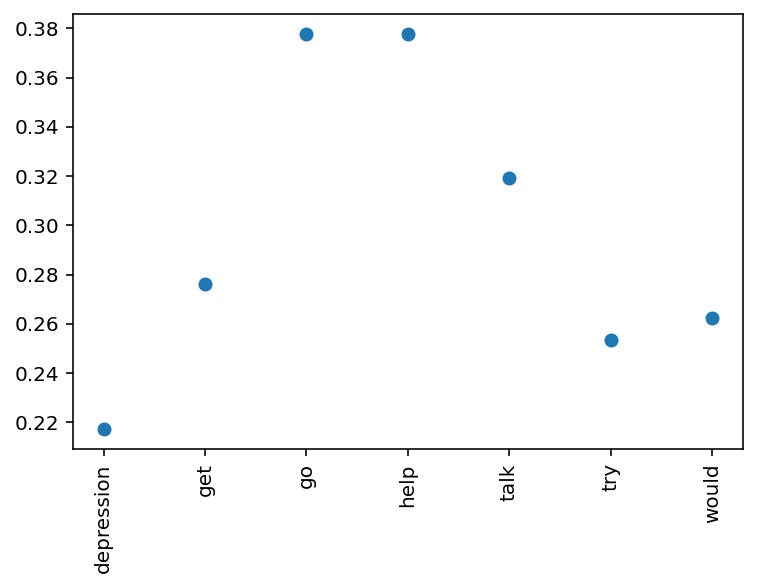

In [59]:
print("Frecuencia de términos por encima del 20% | TF-IDF")
plot_tfidf(Flagged_basic, 0.20)

Cantidad de tokens de textos en bruto


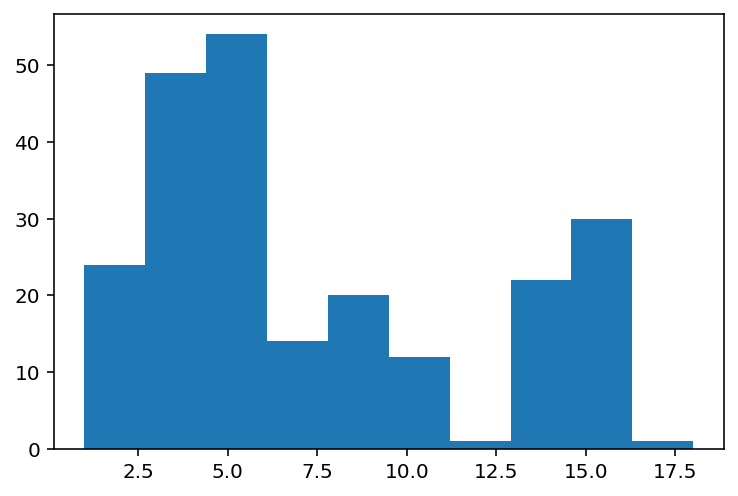

In [60]:
print("Cantidad de tokens de textos en bruto")
hist_cant_word(Flagged_basic)

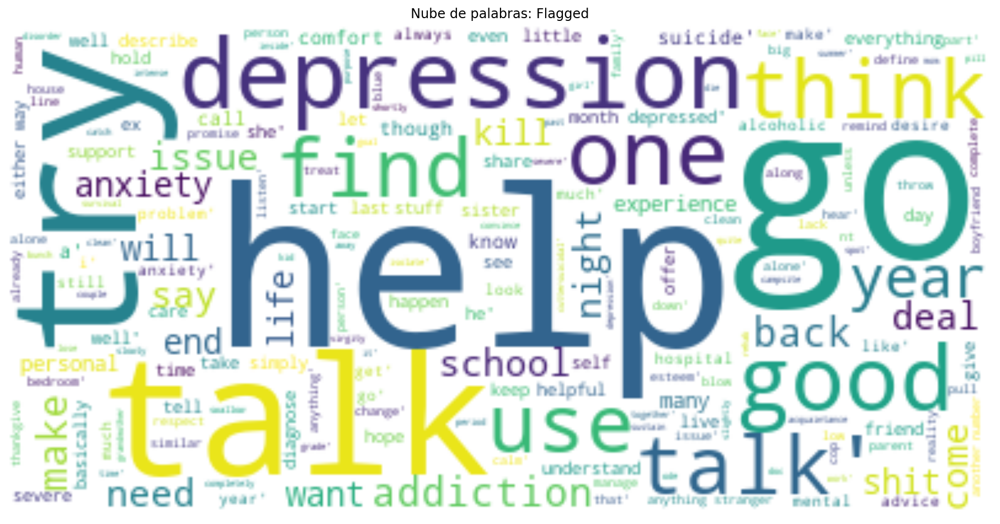

In [ ]:
flagged_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(Flagged_basic))
show_word_cloud(flagged_cloud, "Nube de palabras: Flagged")

# Observaciones finales: 

* Se observa la nueva distribución de frecuencia e importancia de los textos en donde la etiqueta "flagged" ya destacan
palabras que asociamos con riesgo al sucidio o condiciones mentales como "depresión" o "ansiedad".
* Es importante destacar la palabra "help" ya que se presenta en ambos set de datos con notable frecuencia.
* Hay aumento de la data (flagged: 25 -> 227 - not_flagged: 55 -> 243) solo con el preprocesamiento y refuerzo de términos nos indica la calidad de este set de datos en su estado bruto

# Evaluación de datos aumentados

In [61]:
# Carga de las diferentes listas

Flagged_GloVe = pickle.load(open("./Data/Flagged_GloVe.p", "rb" ))
Flagged_LSTM = pickle.load(open("./Data/Flagged_LSTM.p", "rb" ))
Flagged_Summ = pickle.load(open("./Data/Flagged_Summ.p", "rb" ))

NotFlagged_LSTM = pickle.load(open("./Data/NotFlagged_LSTM.p", "rb" ))
NotFlagged_Summ = pickle.load(open("./Data/NotFlagged_Summ.p", "rb" ))

In [62]:
# Limpienza de los datos aumentados por el método Summarization

# flagged
Flagged_Summ = cut_text_len(Flagged_Summ)
Flagged_Summ = clean_text(Flagged_Summ)
Flagged_Summ_Spacy = text_to_spacy(Flagged_Summ)
Flagged_Summ_Stop = delete_stopW(Flagged_Summ_Spacy)

# not_flagged
NotFlagged_Summ = cut_text_len(NotFlagged_Summ)
NotFlagged_Summ = clean_text(NotFlagged_Summ)
NotFlagged_Summ_Spacy = text_to_spacy(NotFlagged_Summ)
NotFlagged_Summ_Stop = delete_stopW(NotFlagged_Summ_Spacy)

In [63]:
# Limpieza de posibles duplicados y creación de la variable final: 'flagged'

Flagged = Flagged_basic + Flagged_LSTM + Flagged_GloVe + Flagged_Summ_Spacy + Flagged_Summ_Stop
Flagged_Final = sorted(duplicated(Flagged))

NotFlagged = NotFlagged_basic + NotFlagged_LSTM + NotFlagged_Summ_Spacy + NotFlagged_Summ_Stop
NotFlagged_Final = sorted(duplicated(NotFlagged))

conjunto_final_temp = Flagged_Final + NotFlagged_Final

In [64]:
print("\n Longitud de la variable final 'flagged':", len(Flagged_Final))
print("\n Longitud de la variable final 'not_flagged':", len(NotFlagged_Final))


 Longitud de la variable final 'flagged': 499

 Longitud de la variable final 'not_flagged': 509


## Visualización

Distribución de cantidad de tokens


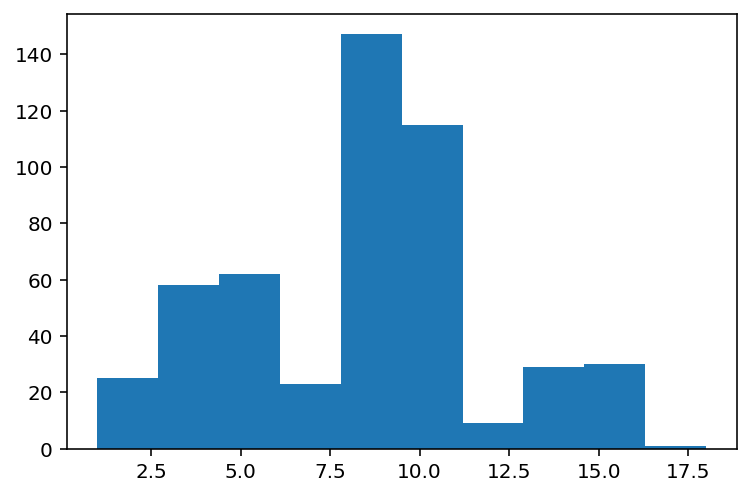

In [65]:
print("Distribución de cantidad de tokens")
hist_cant_word(Flagged_Final)

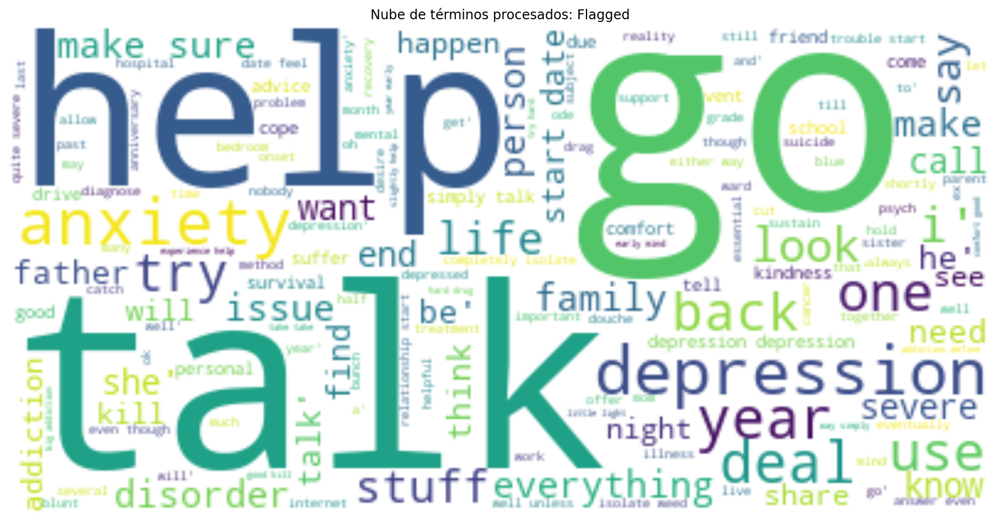

In [66]:
word_list_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(Flagged_Final))
show_word_cloud(word_list_cloud, "Nube de términos procesados: Flagged")

Frecuencia de términos por encima del 20% | TF-IDF


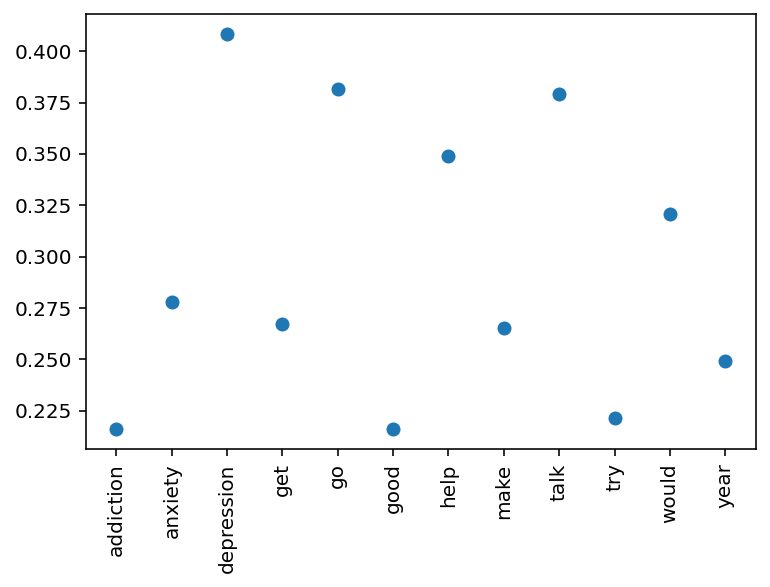

In [67]:
print("Frecuencia de términos por encima del 20% | TF-IDF")
plot_tfidf(Flagged_Final, 0.20)

Distribución de cantidad de tokens


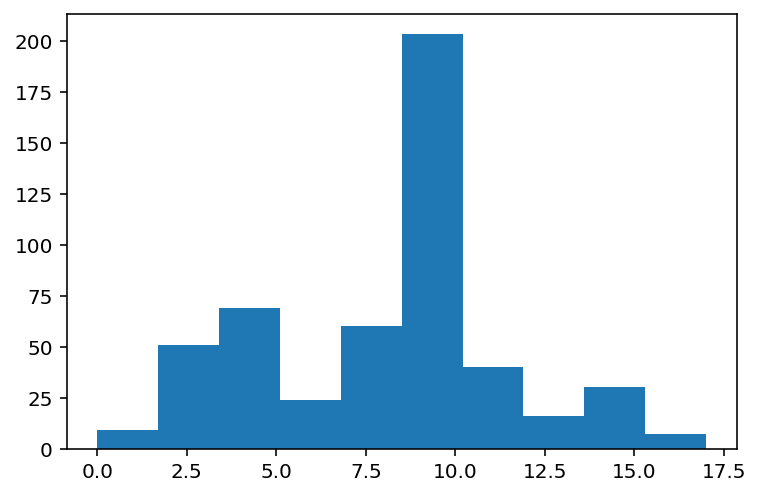

In [68]:
print("Distribución de cantidad de tokens")
hist_cant_word(NotFlagged_Final)

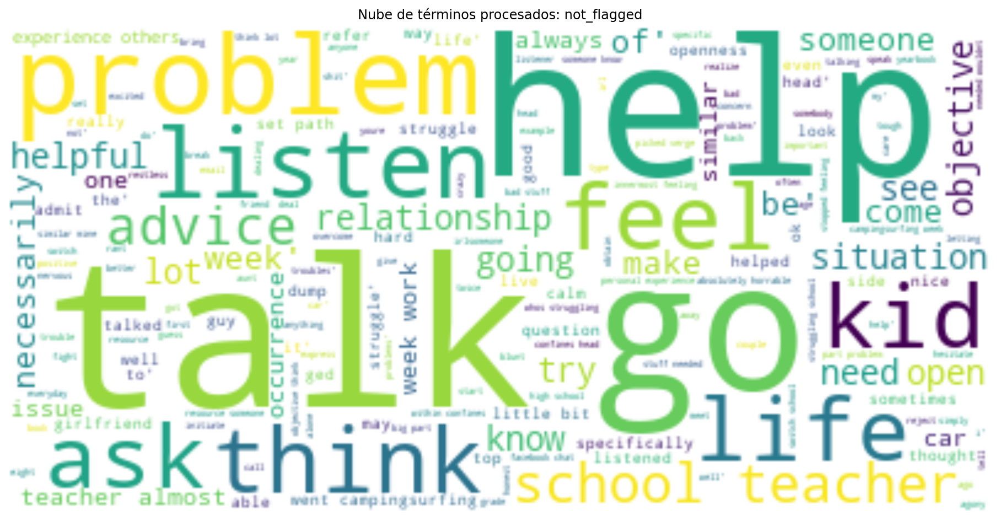

In [69]:
word_list_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(NotFlagged_Final))
show_word_cloud(word_list_cloud, "Nube de términos procesados: not_flagged")

Frecuencia de términos por encima del 20% | TF-IDF


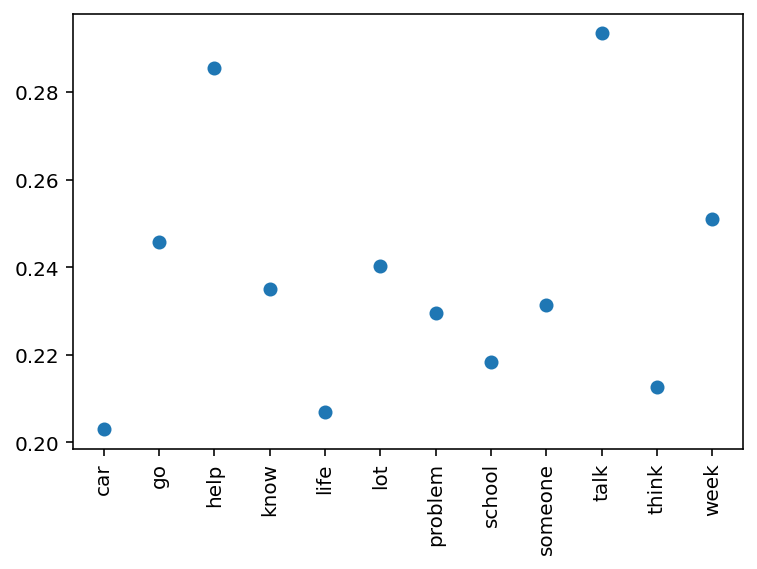

In [70]:
print("Frecuencia de términos por encima del 20% | TF-IDF")
plot_tfidf(NotFlagged_Final, 0.20)

# Conjunto Final: 


Distribución de cantidad de tokens | Conjunto Final


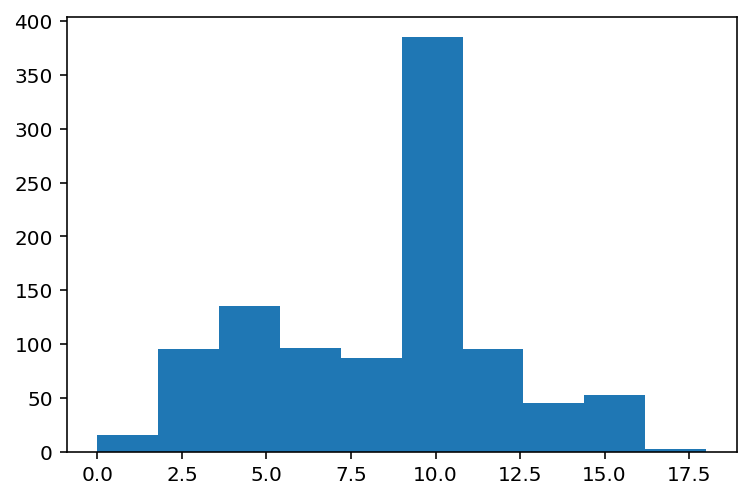

In [71]:
print("Distribución de cantidad de tokens | Conjunto Final")
hist_cant_word(conjunto_final_temp)

Frecuencia de términos por encima del 20% | Conjunto Final | TF-IDF


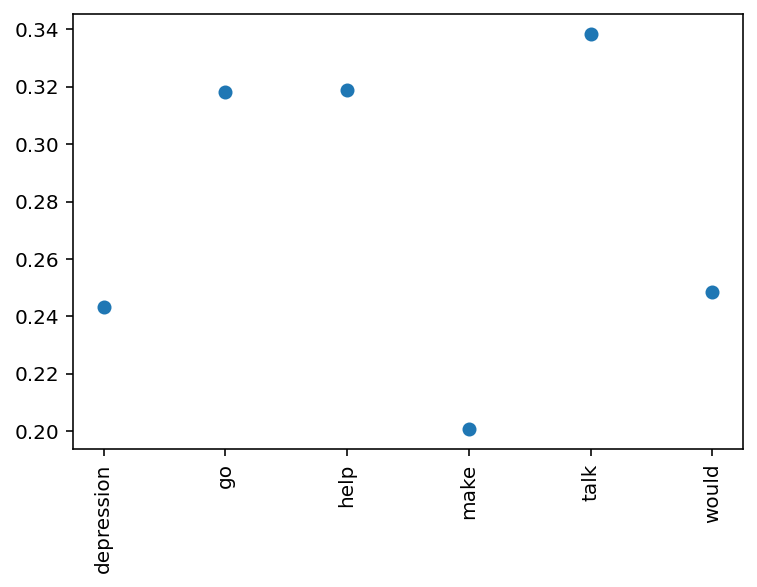

In [72]:
print("Frecuencia de términos por encima del 20% | Conjunto Final | TF-IDF")
plot_tfidf(conjunto_final_temp, 0.20)

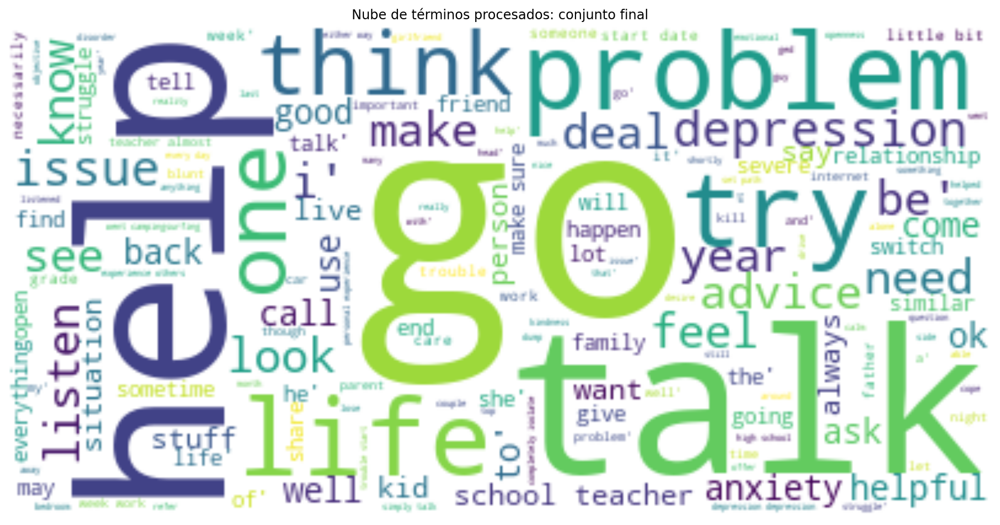

In [73]:
word_list_cloud = WordCloud(stopwords=STOPWORDS, background_color="white").generate(str(conjunto_final_temp))
show_word_cloud(word_list_cloud , "Nube de términos procesados: conjunto final")

# Creación de dataset final

In [74]:

pre_df_flagged = []

for sentence in Flagged_Final: 
    random_number = int(random.gauss(30, 300))
    pre_df_flagged.append([sentence, 'flagged', 1, random_number])

pre_df_not_flagged = []
for sentence in NotFlagged_Final:
    random_number = int(random.gauss(30, 300)) 
    pre_df_not_flagged.append([sentence, 'not_flagged', 0, random_number])

pre_df = pre_df_not_flagged + pre_df_flagged


In [75]:
df = pd.DataFrame(pre_df, columns=['text', 'label', 'label_bi', 'index'])
df.head(10)

,text,label,label_bi,index
0,,not_flagged,0,-202
1,a couple of year ago my be go to switch school...,not_flagged,0,-211
2,a lot for my,not_flagged,0,-41
3,a that be a and just talk to her tryin to make...,not_flagged,0,324
4,able therapist thoughts others faced circumsta...,not_flagged,0,-77
5,absolutely helped book speak see many speak th...,not_flagged,0,-647
6,act life she have can through he or not see,not_flagged,0,-446
7,act objective not well too nervous my way too ...,not_flagged,0,-326
8,acted fairly common occurrence school teacher ...,not_flagged,0,-140
9,acted resource someone struggling school,not_flagged,0,-50


In [76]:
df = df.sort_values(by ='index')
df.head(20)

,text,label,label_bi,index
651,ex have onset and anxiety,flagged,1,-909
108,dumps expressing one schoolwork so think my li...,not_flagged,0,-903
441,that need it be a fairly common occurrence,not_flagged,0,-837
736,i call back and get a hospital number so i kno...,flagged,1,-833
145,gave least went campingsurfing week work throu...,not_flagged,0,-783
321,others even truth hurts best way start even would,not_flagged,0,-758
451,thing,not_flagged,0,-736
250,letting know fell open dialog,not_flagged,0,-718
641,eventually anything time end trouble start date,flagged,1,-708
631,either death hold talk they look addiction def...,flagged,1,-705


In [77]:
columns_df = df[['text', 'label', 'label_bi']]
df_final = columns_df.copy()
columns_name = ["text", "label", 'label_bi']
df_final.columns = columns_name
df_final.head()

,text,label,label_bi
651,ex have onset and anxiety,flagged,1
108,dumps expressing one schoolwork so think my li...,not_flagged,0
441,that need it be a fairly common occurrence,not_flagged,0
736,i call back and get a hospital number so i kno...,flagged,1
145,gave least went campingsurfing week work throu...,not_flagged,0


# Set de datos final

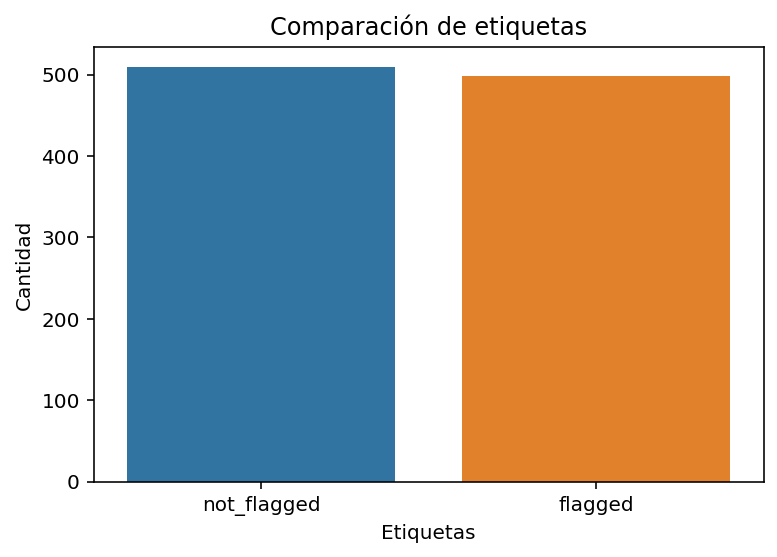

In [78]:
sns_histo(df_final, label_x = "Etiquetas", label_y = "Cantidad", title_graph = "Comparación de etiquetas")

In [80]:
pickle.dump(df, open("./data/df.p", "wb" ))